<div class="alert alert-block alert-info">

<h1 style="font-family:verdana;"> Description:</h1>

<ul>
<li><p style="font-family:verdana;">
In this notebook, we are going to perform the Exploratory Data Analysis for the Chicago Taxi Trip demo.
</p></li>
    
<li><p style="font-family:verdana;">
The dataset has data from 2013 to 2023 of taxicab trips, more details can be found <a href="https://www.kaggle.com/datasets/chicago/chicago-taxi-trips-bq/data?select=taxi_trips">here</a>.
</p></li>

<li><p style="font-family:verdana;">
The dataset contains the labels which we have to predict and the labels are continuous. So the problem we have is a Supervised Regression type.
</p></li> 

<li><p style="font-family:verdana;">
The objective is to predict the fare of a cab trip. With that in mind, we will analyze the features and its impect on fare.
</p></li>
</ul>

</div>

## Index
1. [Import needed packages](#step0)
2. [Load a sample of the data](#step-1-load-a-sample-of-the-data)
3. [Quickly get info of the dataset](#2)
4. [Split into numerical and categorical variables](#3)
    1. [Statistical and descriptive analysis](#31)
    2. [Feature refinement](#32)
5. [Exploratory Data Analysis](#4)
    1. [EDA over numerical features](#41)
        1. [Outlier removal - Part I](#411)
        2. [Outlier removal - Part II](#412)
        3. [Numerical features selection](#413)
        4. [Categorical features analysis](#42-explore-the-categorical-features)
6. [Work vs Non-work days and hours](#step-5-total-fare-for-workdays-weekends-work-and-non-work-hours)
6. [Conclusions](#6-conclusions)

<a id='step0'></a>
## Step 0: import the needed packages.

In [54]:
from google.cloud import bigquery
import numpy as np
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns

import warnings

warnings.filterwarnings('ignore')

<a id=1></a>
## Step 1: load a sample of the data

In [2]:
# Define sample size (e.g., 100,000 rows)
sample_size = 300000

# Define the public dataset and table
public_project = "bigquery-public-data"
public_dataset = "chicago_taxi_trips"
public_table = "taxi_trips"

# Construct a query to sample the data
query = f"""
SELECT * FROM `{public_project}.{public_dataset}.{public_table}`
WHERE RAND() < {sample_size}/(SELECT COUNT(*) FROM `{public_project}.{public_dataset}.{public_table}`)
LIMIT {sample_size};
"""

# Create a BigQuery client
client = bigquery.Client()

# Query the data and return a pandas DataFrame
df_sample = client.query(query).to_dataframe()

<a id=2></a>
## Step 2: Quickly get info of the dataset

In [3]:
df_sample.head(5)

,unique_key,taxi_id,trip_start_timestamp,trip_end_timestamp,trip_seconds,trip_miles,pickup_census_tract,dropoff_census_tract,pickup_community_area,dropoff_community_area,...,extras,trip_total,payment_type,company,pickup_latitude,pickup_longitude,pickup_location,dropoff_latitude,dropoff_longitude,dropoff_location
0,d8b300f751825a5daeb78d41288394985683bae9,9d69a11bc339eab6a17462295d8f4f5800a8157081ad55...,2014-11-16 19:00:00+00:00,2014-11-16 19:15:00+00:00,840,3.80,<NA>,<NA>,4,6,...,0.0,11.05,Cash,None,41.975171,-87.687516,POINT (-87.68751551520002 41.9751709433),41.944227,-87.655998,POINT (-87.6559981815 41.9442266014)
1,51a8b6e1513be3c1b88c654ed82f501b6e2a7479,5027ab588dd646469d3d23662190200f0531c1e6f9a918...,2014-12-02 14:15:00+00:00,2014-12-02 14:15:00+00:00,0,4.40,17031240300,17031320100,24,32,...,0.0,16.71,Credit Card,None,41.912364,-87.675063,POINT (-87.6750627566 41.9123643542),41.884987,-87.620993,POINT (-87.6209929134 41.8849871918)
2,b660776f209f0931781707c94470a8a5c2579eea,68493b3174493e98d99b8493bc0902735bc099df7761d0...,2014-11-06 17:45:00+00:00,2014-11-06 17:45:00+00:00,0,0.00,17031833100,17031833100,28,28,...,0.0,3.25,Cash,None,41.879067,-87.657005,POINT (-87.657005027 41.8790669938),41.879067,-87.657005,POINT (-87.657005027 41.8790669938)
3,924420906584683cb08171ee6a3216305d6d724a,a9f2676ec0576e93978c2edf2d1172b744f2f80ee76b2a...,2014-10-07 17:30:00+00:00,2014-10-07 17:45:00+00:00,300,1.00,<NA>,<NA>,29,29,...,0.0,5.05,Cash,None,41.860190,-87.717220,POINT (-87.7172201 41.8601900192),41.860190,-87.717220,POINT (-87.7172201 41.8601900192)
4,e99ce606838fd005d9764855faef51b88857693a,c952e2154df522c6d7d11934aa87ff21be39a0a1d43b8e...,2014-10-31 17:45:00+00:00,2014-10-31 17:45:00+00:00,300,0.29,17031160300,17031160300,16,16,...,0.0,5.25,Cash,None,41.957264,-87.730899,POINT (-87.7308987849 41.9572641084),41.957264,-87.730899,POINT (-87.7308987849 41.9572641084)


In [4]:
df_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299831 entries, 0 to 299830
Data columns (total 23 columns):
 #   Column                  Non-Null Count   Dtype              
---  ------                  --------------   -----              
 0   unique_key              299831 non-null  object             
 1   taxi_id                 299831 non-null  object             
 2   trip_start_timestamp    299831 non-null  datetime64[us, UTC]
 3   trip_end_timestamp      299822 non-null  datetime64[us, UTC]
 4   trip_seconds            299696 non-null  Int64              
 5   trip_miles              299826 non-null  float64            
 6   pickup_census_tract     208198 non-null  Int64              
 7   dropoff_census_tract    206472 non-null  Int64              
 8   pickup_community_area   277006 non-null  Int64              
 9   dropoff_community_area  270789 non-null  Int64              
 10  fare                    299826 non-null  float64            
 11  tips                    29

Visually description of missing values of the random sample.

<Axes: >

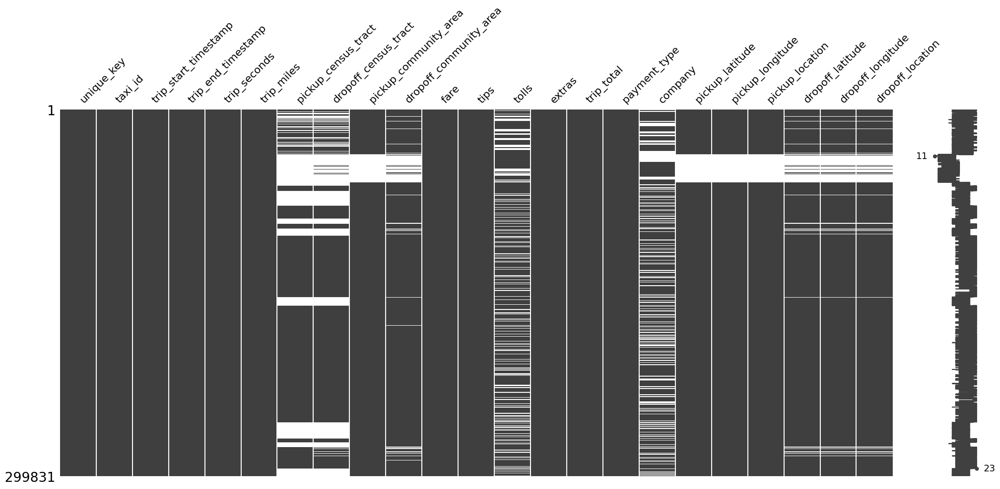

In [5]:
msno.matrix(df_sample)

As told in the Kaggle's site, the pickup and dropoff census tract is not always saved so it's expected to have a lot of missing values. 

<Axes: >

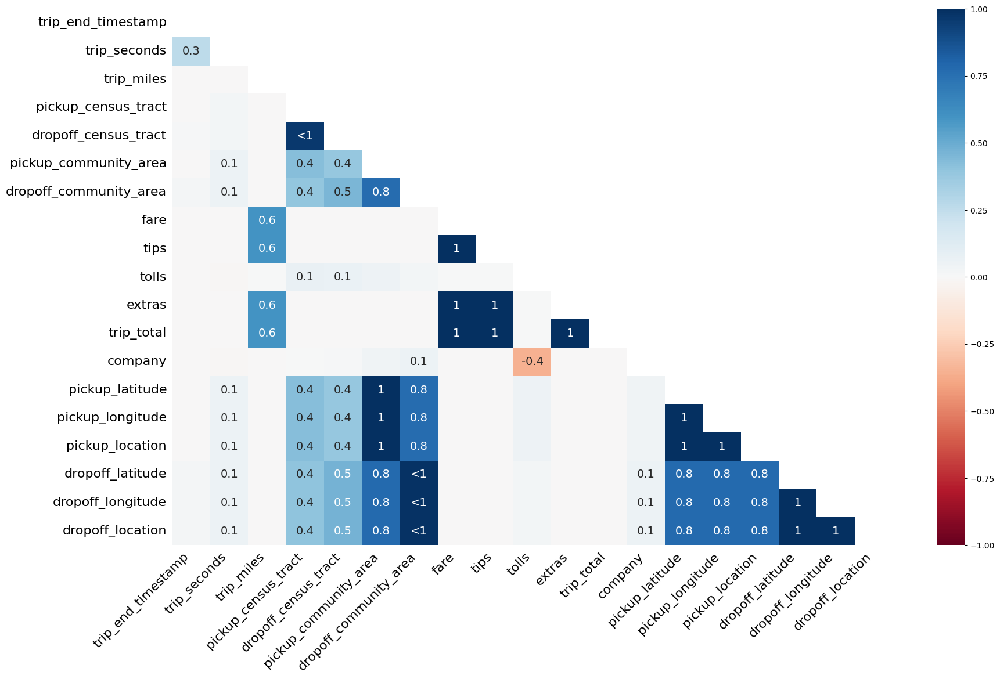

In [6]:
msno.heatmap(df_sample)

As explained in the `missingno`'s [github](https://github.com/ResidentMario/missingno?tab=readme-ov-file): _The missingno correlation heatmap measures nullity correlation: how strongly the presence or absence of one variable affects the presence of another._ 

Also, _Nullity correlation ranges from -1 (if one variable appears the other definitely does not) to 0 (variables appearing or not appearing have no effect on one another) to 1 (if one variable appears the other definitely also does)._

<a id=3></a>
## Step 3: Split the dataset into categorical and numerical variables. Then, get some descriptive analysis.

<a id=31></a>
#### 3.1 Statistical and descriptive analysis over numerical and categorical features

In [7]:
# Select numerical columns
numerical_features = df_sample.select_dtypes(include=[np.number]).columns
df_numerical_sample = df_sample[numerical_features]

# Select categorical columns
categorical_features = df_sample.select_dtypes(include=[object]).columns
df_categorical_sample = df_sample[categorical_features]

In [8]:
# Print total rows and columns of numerical and categorical samples
print(f"Numerical sample:\nRows = {df_numerical_sample.shape[0]}\nColumns = {df_numerical_sample.shape[1]}")
print(f"Categorical sample:\nRows = {df_categorical_sample.shape[0]}\nColumns = {df_categorical_sample.shape[1]}")

Numerical sample:
Rows = 299831
Columns = 15
Categorical sample:
Rows = 299831
Columns = 6


In [9]:
# Print info of numerical sample
df_numerical_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299831 entries, 0 to 299830
Data columns (total 15 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   trip_seconds            299696 non-null  Int64  
 1   trip_miles              299826 non-null  float64
 2   pickup_census_tract     208198 non-null  Int64  
 3   dropoff_census_tract    206472 non-null  Int64  
 4   pickup_community_area   277006 non-null  Int64  
 5   dropoff_community_area  270789 non-null  Int64  
 6   fare                    299826 non-null  float64
 7   tips                    299826 non-null  float64
 8   tolls                   228298 non-null  float64
 9   extras                  299826 non-null  float64
 10  trip_total              299826 non-null  float64
 11  pickup_latitude         277044 non-null  float64
 12  pickup_longitude        277044 non-null  float64
 13  dropoff_latitude        271562 non-null  float64
 14  dropoff_longitude   

In [10]:
# Statistical summaty of numerical sample
df_numerical_sample.describe().T

,count,mean,std,min,25%,50%,75%,max
trip_seconds,299696.0,821.219462,1380.528499,0.0,360.0,554.0,960.0,86348.0
trip_miles,299826.0,3.917464,15.930466,0.0,0.77,1.5,3.67,1930.0
pickup_census_tract,208198.0,17031378683.517172,344602.963457,17031010100.0,17031081403.0,17031281900.0,17031839100.0,17031980100.0
dropoff_census_tract,206472.0,17031361807.212818,334596.358468,17031010100.0,17031081402.0,17031280100.0,17031833000.0,17031980100.0
pickup_community_area,277006.0,23.824455,20.022951,1.0,8.0,24.0,32.0,77.0
dropoff_community_area,270789.0,21.857683,17.963422,1.0,8.0,22.0,32.0,77.0
fare,299826.0,13.193527,49.371627,0.0,6.0,8.0,13.25,9001.02
tips,299826.0,1.389493,2.623289,0.0,0.0,0.0,2.0,150.0
tolls,228298.0,0.009125,0.65222,0.0,0.0,0.0,0.0,88.5
extras,299826.0,0.954835,9.605793,0.0,0.0,0.0,1.0,5001.11


As seen in the table above, there are outliers which skew the statistics. For example, there is a trip that lasted $86360s \approx 23.98h$, meanwhile the mean trip duration is $865.56s \approx 14.43m \approx 0.24h$. 

Later in this notebook, we will remove the outliers.

In [11]:
# Percentage of non-null values in each column
df_numerical_sample.count() / df_numerical_sample.shape[0] * 100

trip_seconds              99.954975
trip_miles                99.998332
pickup_census_tract       69.438450
dropoff_census_tract      68.862793
pickup_community_area     92.387378
dropoff_community_area    90.313877
fare                      99.998332
tips                      99.998332
tolls                     76.142227
extras                    99.998332
trip_total                99.998332
pickup_latitude           92.400052
pickup_longitude          92.400052
dropoff_latitude          90.571689
dropoff_longitude         90.571689
dtype: float64

In [12]:
# Print info of categorical sample
df_categorical_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299831 entries, 0 to 299830
Data columns (total 6 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   unique_key        299831 non-null  object
 1   taxi_id           299831 non-null  object
 2   payment_type      299831 non-null  object
 3   company           213118 non-null  object
 4   pickup_location   277044 non-null  object
 5   dropoff_location  271562 non-null  object
dtypes: object(6)
memory usage: 13.7+ MB


In [13]:
# Statistical summaty of categorical sample
df_categorical_sample.describe().T

,count,unique,top,freq
unique_key,299831,299831,66cb117722a68aac6be88dad000d3523a132d357,1
taxi_id,299831,7782,0861cb74337c620cb9ec639af7dc3aa99173b768caf750...,224
payment_type,299831,10,Cash,177984
company,213118,99,Flash Cab,31242
pickup_location,277044,379,POINT (-87.6327464887 41.8809944707),33069
dropoff_location,271562,455,POINT (-87.6327464887 41.8809944707),27427


In [14]:
# Percentage of non-null values in each column
df_categorical_sample.count() / df_categorical_sample.shape[0] * 100

unique_key          100.000000
taxi_id             100.000000
payment_type        100.000000
company              71.079375
pickup_location      92.400052
dropoff_location     90.571689
dtype: float64

<a id=32></a>
#### 3.2 Refinement of numerical and categorical columns, dropping the features that have a small percentage of non-null data

In [15]:
# Refine numerical features
refined_numerical_features = [i for i in df_numerical_sample.columns if df_numerical_sample[i].count() / df_numerical_sample[i].shape[0] * 100 > 80]
df_refined_numerical_sample = df_numerical_sample[refined_numerical_features]

# Drop rows with missing values
df_refined_numerical_sample = df_refined_numerical_sample.dropna()

# Refine categorical features
refined_categorical_features = [i for i in df_categorical_sample.columns if df_categorical_sample[i].count() / df_categorical_sample[i].shape[0] * 100 > 80]
df_refined_categorical_sample = df_categorical_sample[refined_categorical_features]

# Drop rows with missing values
df_refined_categorical_sample = df_refined_categorical_sample.dropna()

<a id=4></a>
## Step 4: Do some EDA on both samples

<a id=41></a>
#### 4.1 Explore the numerical features and remove outliers

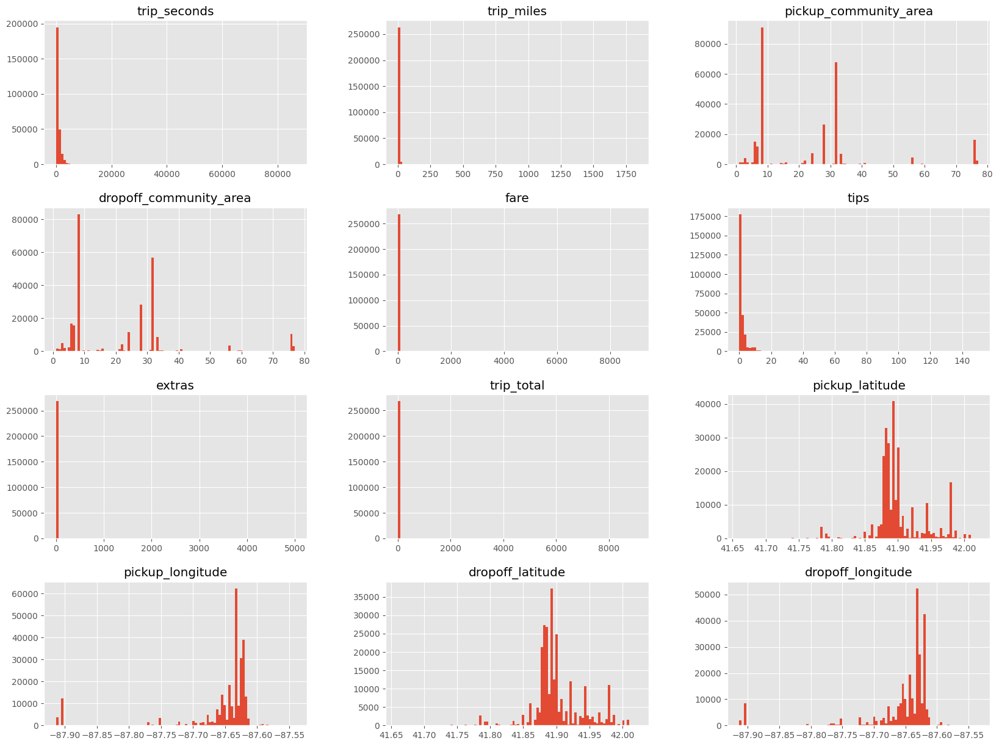

In [16]:
# Plot the histogram of numerical features in a grid
plt.style.use('ggplot')
df_refined_numerical_sample.hist(bins=100, figsize=(20, 15))
plt.show()

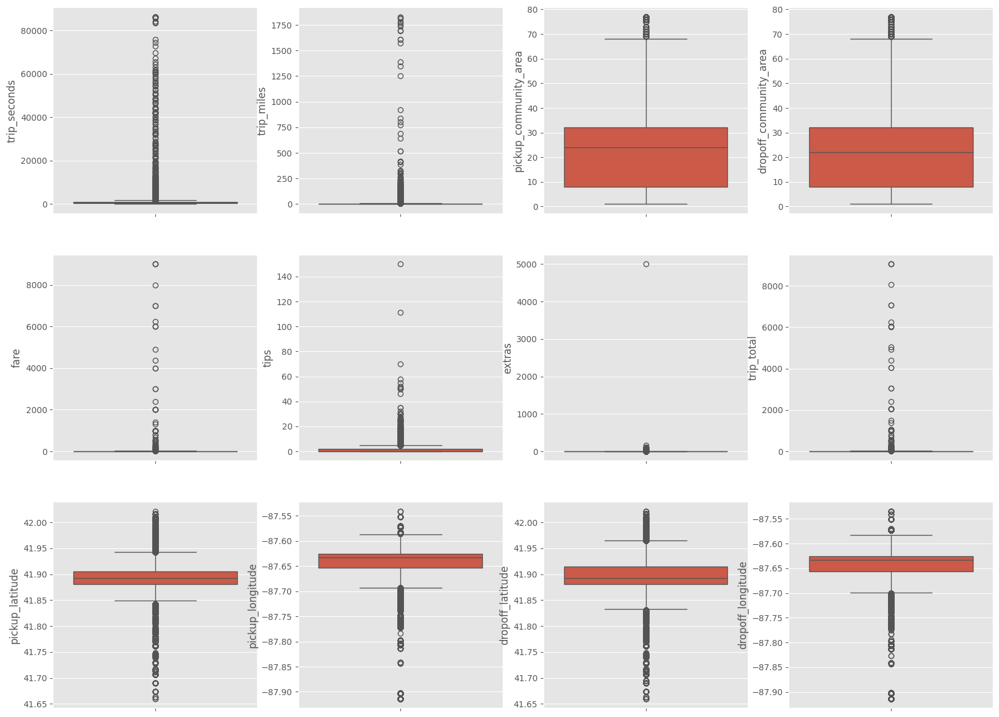

In [17]:
# Plot the boxplot to detect outliers more precisely in a grid layout
plt.style.use('ggplot')
fig, ax = plt.subplots(3, 4, figsize=(20, 15))
for i, feature in enumerate(df_refined_numerical_sample.columns):
    if i < len(ax.flat):
        sns.boxplot(df_refined_numerical_sample[feature], ax=ax.flat[i])
    else:
        ax.flat[i].remove()
plt.show()

Clearly, as pointed out previously, there are a lot of outliers in the numerical sample. Let's filter the outliers and do an in-depth EDA to refine the filters.

<a id=411></a>
##### 4.1.1 First iteration of outlier removal

In [18]:
# Filter trip seconds greater than 6000 seconds
trip_seconds_filter = df_refined_numerical_sample["trip_seconds"] <= 6000

# Filter trip miles greater than 50 miles
trip_minutes_filter = df_refined_numerical_sample["trip_miles"] <= 50

# Filter fare greater than 100 dollars
trip_fare_filter = df_refined_numerical_sample["fare"] <= 100

# Filter tips greater than 15 dollars
tips_filter = df_refined_numerical_sample["tips"] <= 15


# Filter extras greater than 10 dollars
extras_filter = df_refined_numerical_sample["extras"] <= 10

# Filter trip total greater than 100 dollars
trip_total_filter = df_refined_numerical_sample["trip_total"] <= 100

# Build filter
filter = (trip_seconds_filter) & (trip_minutes_filter) & (trip_fare_filter) & (tips_filter) & (extras_filter) & (trip_total_filter)

# Apply filter
df_refined_numerical_sample = df_refined_numerical_sample[filter]

In [19]:
# Show the rows left after filtering
print(f"Numerical sample:\nRows = {df_refined_numerical_sample.shape[0]}\nColumns = {df_refined_numerical_sample.shape[1]}")
print("---"*6)
print(f"Percentage of rows left after filtering: {df_refined_numerical_sample.shape[0] / df_numerical_sample.shape[0] * 100:.2f}%")

Numerical sample:
Rows = 266963
Columns = 12
------------------
Percentage of rows left after filtering: 89.04%


Let's see how the histograms look like now that we removed the outliers

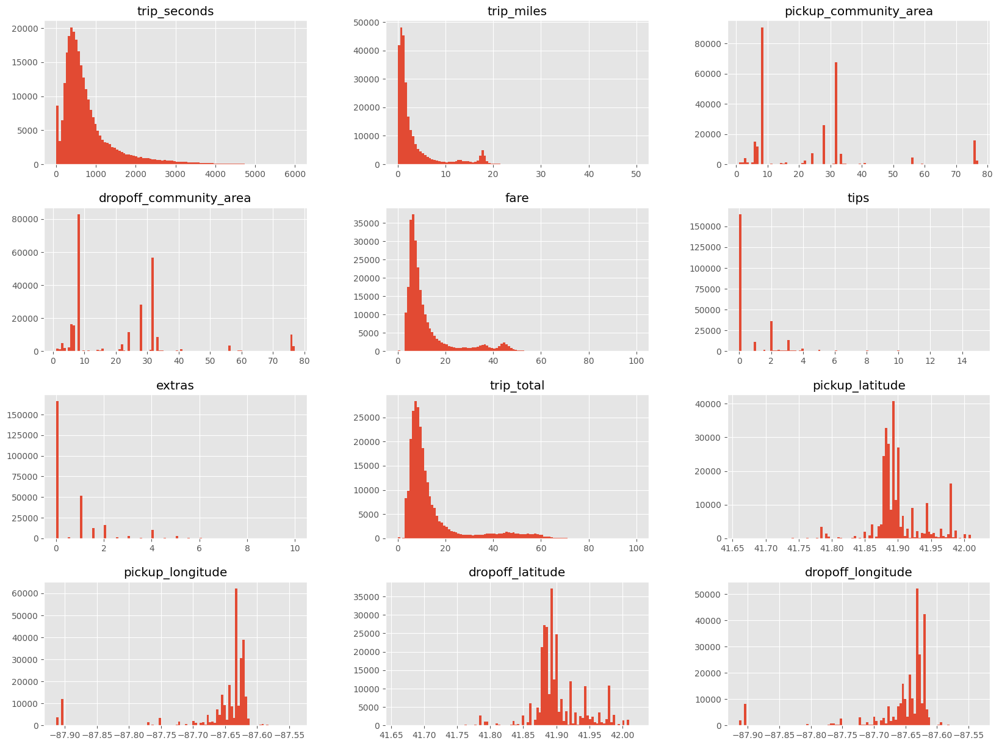

In [20]:
plt.style.use('ggplot')
df_refined_numerical_sample.hist(bins=100, figsize=(20, 15))
plt.show()

As can be seen, `tips` and `extras` do not add useful information. However, let's keep them for further analysis.

Now we will see what the boxplots looks like.

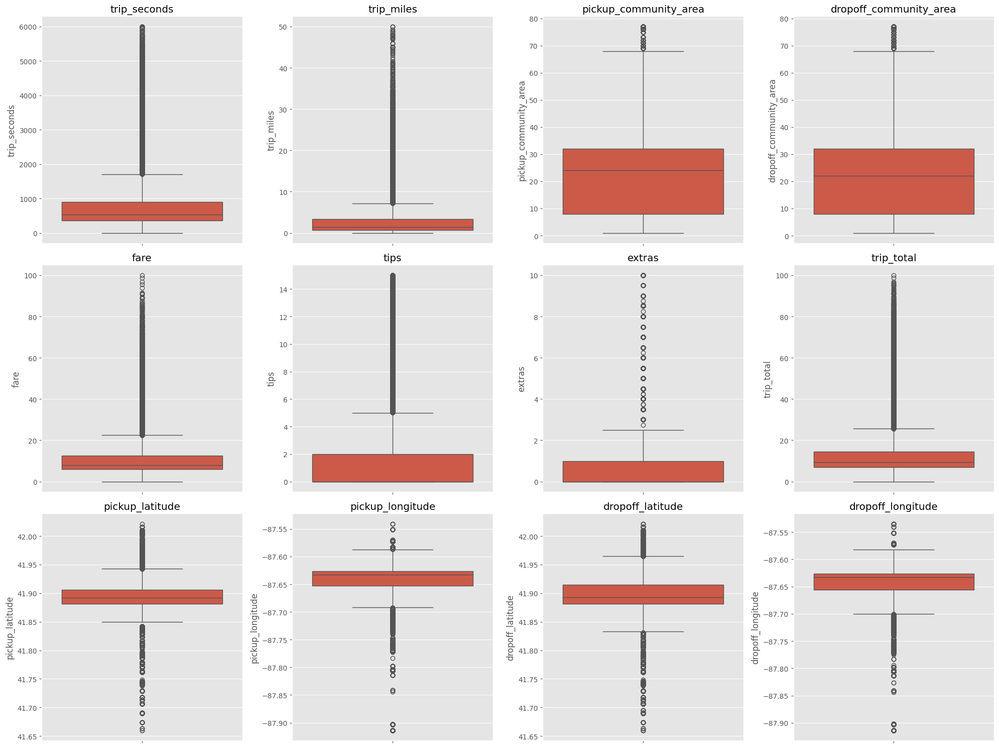

In [21]:
# Plot the boxplots in a grid of 4x2
plt.style.use('ggplot')
num_features = len(df_refined_numerical_sample.columns)
rows = (num_features + 3) // 4  # Calculate the required number of rows

fig, axes = plt.subplots(rows, 4, figsize=(20, 10 * rows // 2))
axes = axes.flatten()  # Flatten the axes into a 1D array

for i, feature in enumerate(df_refined_numerical_sample.columns):
    ax = axes[i]
    sns.boxplot(df_refined_numerical_sample[feature], ax=ax)
    ax.set_title(feature)

# Turn off the unused axes
for ax in axes[num_features:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

We can go even further and apply some extra filtering to drop the outliers.

<a id=412></a>
##### 4.1.2 Second iteration of outlier removal.

In [22]:
# Filter trip seconds greater than 3000 seconds
trip_seconds_filter = df_refined_numerical_sample["trip_seconds"] <= 3000

# Flter trip miles greater than 20 miles
trip_minutes_filter = df_refined_numerical_sample["trip_miles"] <= 20

# Filter fare greater than 40 dollars
trip_fare_filter = df_refined_numerical_sample["fare"] <= 40

# Filter tips greater than 8 dollars
tips_filter = df_refined_numerical_sample["tips"] <= 8

# Filter trip total greater than 50 dollars
trip_total_filter = df_refined_numerical_sample["trip_total"] <= 50

# Build filter
filter = (trip_seconds_filter) & (trip_minutes_filter) & (trip_fare_filter) & (tips_filter) & (trip_total_filter)

# Apply filter
df_refined_numerical_sample = df_refined_numerical_sample[filter]

In [23]:
# Show the rows left after filtering
print(f"Numerical sample:\nRows = {df_refined_numerical_sample.shape[0]}\nColumns = {df_refined_numerical_sample.shape[1]}")
print("---"*6)
print(f"Percentage of rows left after filtering: {df_refined_numerical_sample.shape[0] / df_numerical_sample.shape[0] * 100:.2f}%")

Numerical sample:
Rows = 248937
Columns = 12
------------------
Percentage of rows left after filtering: 83.03%


Let's see how the histogram and boxplots are after a further filtering.

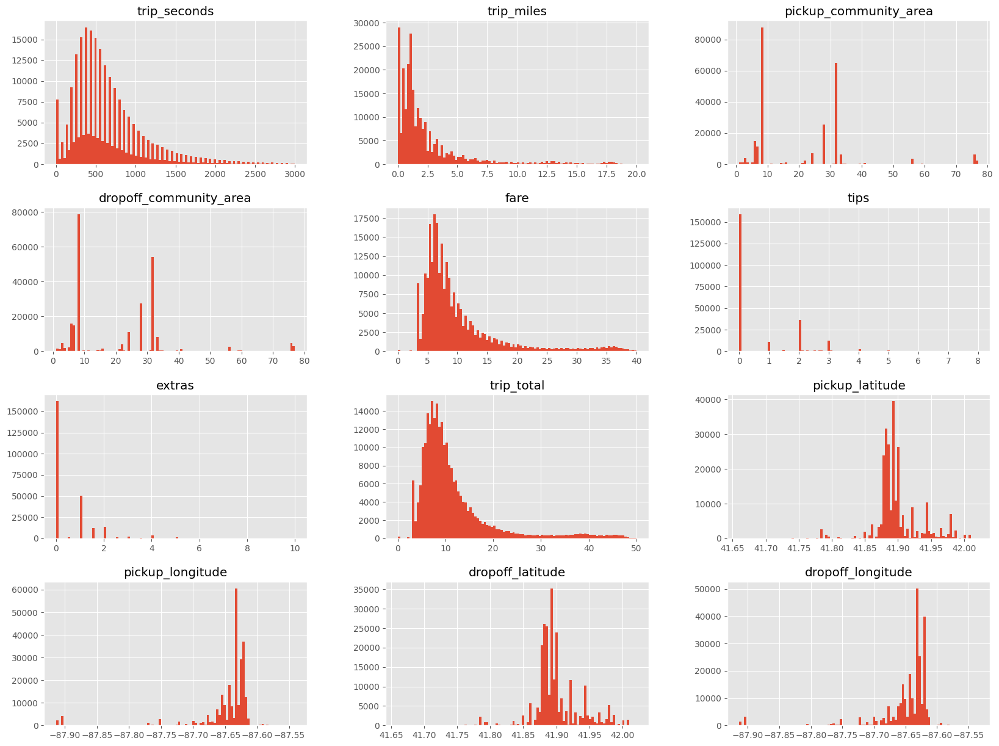

In [24]:
plt.style.use('ggplot')
df_refined_numerical_sample.hist(bins=100, figsize=(20, 15))
plt.show()

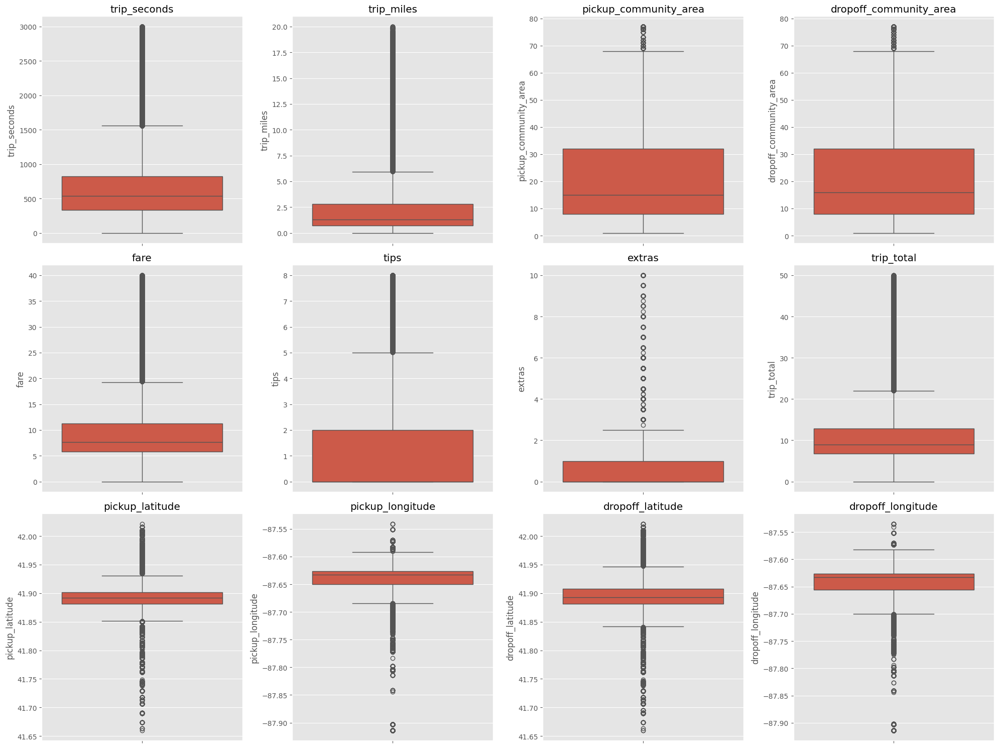

In [25]:
# Plot the boxplots in a grid of 4x2
plt.style.use('ggplot')
num_features = len(df_refined_numerical_sample.columns)
rows = (num_features + 3) // 4  # Calculate the required number of rows

fig, axes = plt.subplots(rows, 4, figsize=(20, 10 * rows // 2))
axes = axes.flatten()  # Flatten the axes into a 1D array

for i, feature in enumerate(df_refined_numerical_sample.columns):
    ax = axes[i]
    sns.boxplot(df_refined_numerical_sample[feature], ax=ax)
    ax.set_title(feature)

# Turn off the unused axes
for ax in axes[num_features:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

Plot the pairplot of the filtered data

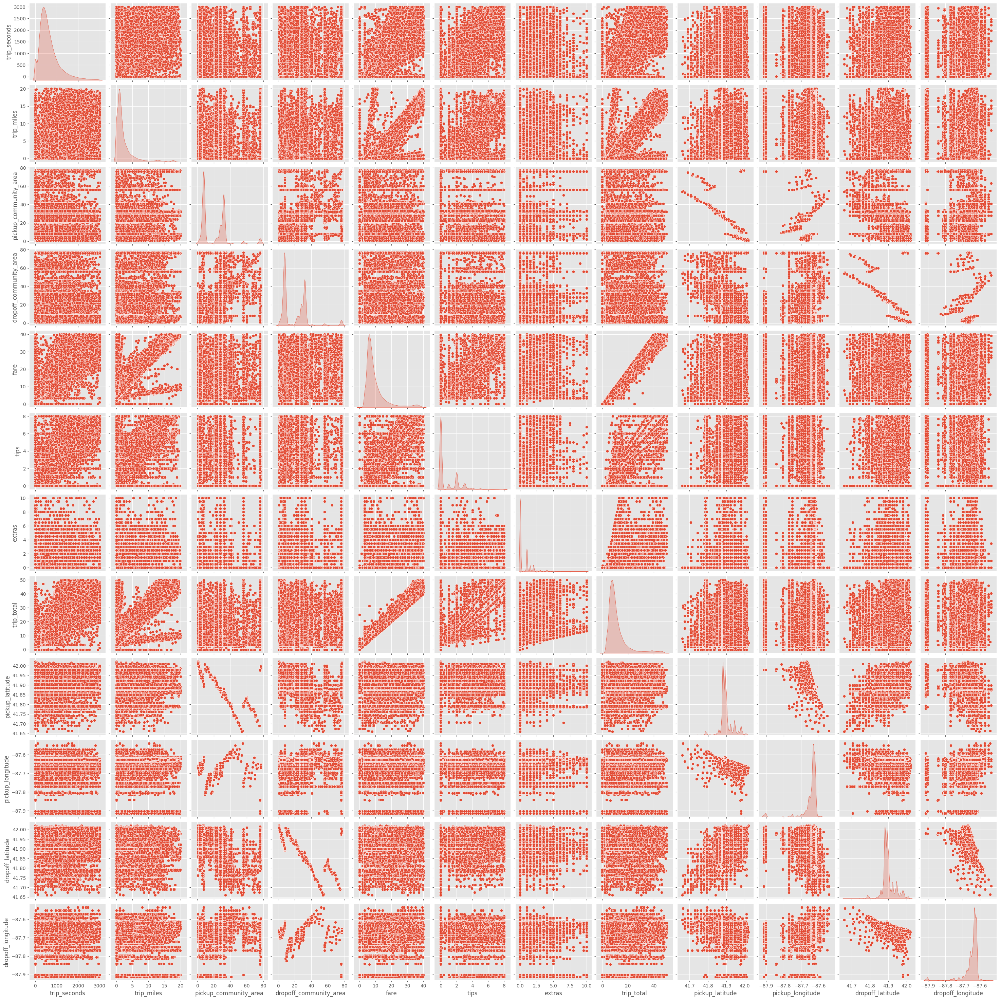

In [26]:
# Pair plot
plt.style.use('ggplot')
sns.pairplot(df_refined_numerical_sample, diag_kind='kde')
plt.show()

Now it is more evident that `tips`, `extras`, `pickup_community_area`, `dropoff_community_area`, pickup and dropoff `latitude` and `longitude` do not have a tight correlation with `fare`. Then we can drop those columns.

 Also, `trip_total` has a highly correlation but only because it is `trip_total = fare + tips + tolls + extras`, which is a linear relationship.

<a id=413></a>
##### 4.1.3 Numerical feature selection.

In [27]:
selected_numerical_features = ["trip_seconds", "trip_miles", "fare", "trip_total"]
ctt_numerical_df = df_refined_numerical_sample[selected_numerical_features]

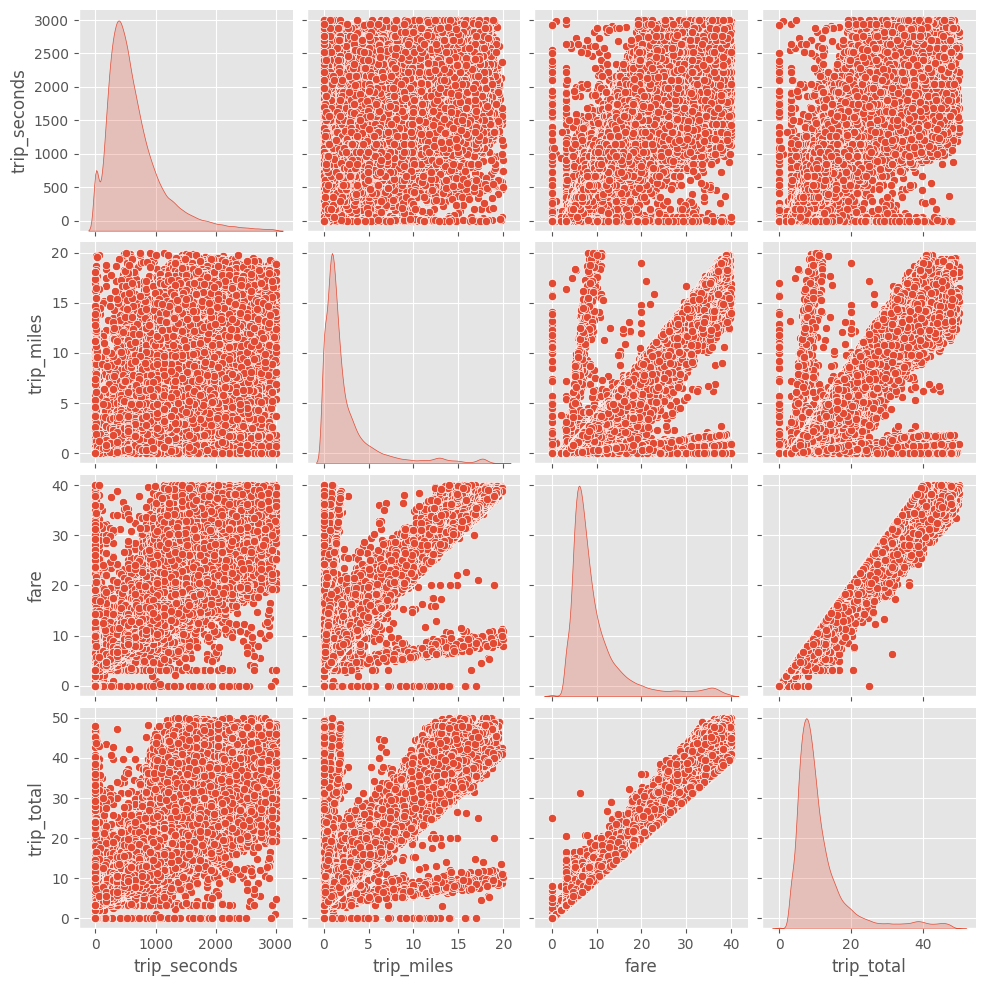

In [28]:
# Pair plot
plt.style.use('ggplot')
sns.pairplot(ctt_numerical_df, diag_kind='kde')
plt.show()

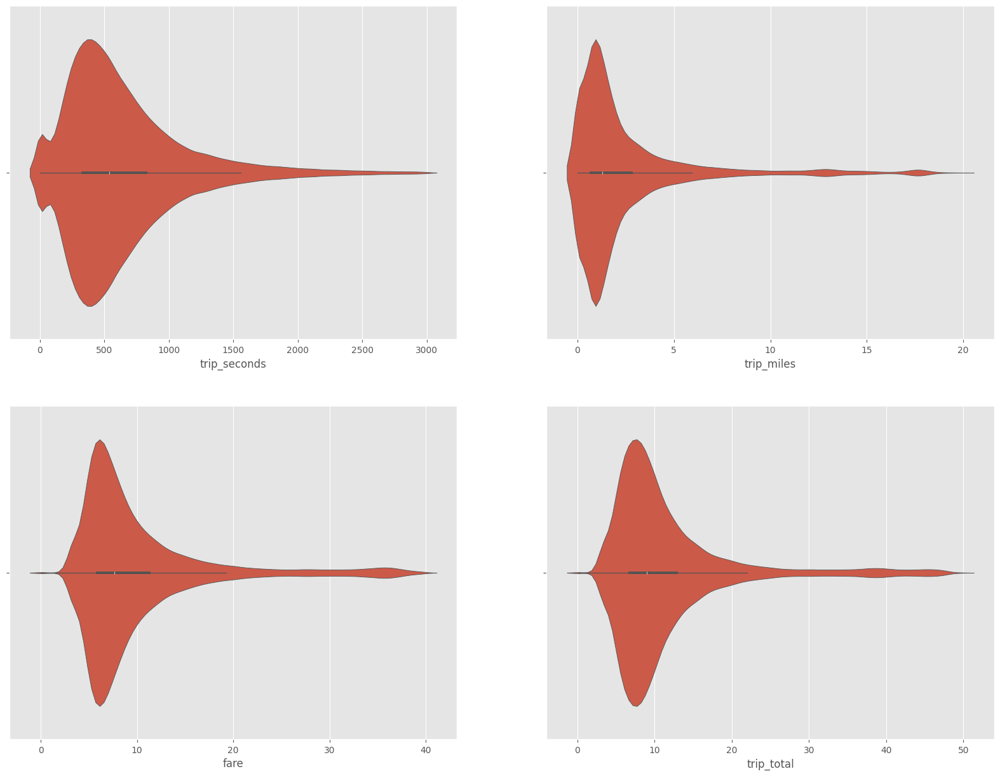

In [29]:
# Violin plot of the selected numerical features
plt.style.use('ggplot')
fig, ax = plt.subplots(2, 2, figsize=(20, 15))
for i, feature in enumerate(selected_numerical_features):
    sns.violinplot(ctt_numerical_df[feature], ax=ax.flat[i], orient="h")
plt.show()

<a id=42></a>
#### 4.2 Explore the categorical features

Let's see the distribution of `company` and `payment_type`.

In [30]:
company = df_categorical_sample["company"].value_counts()
company_percentage = company / company.sum() * 100

company_data = {company_percentage.index[i]: company_percentage.values[i] for i in range(len(company_percentage))}


In [31]:
other_companies_perc = 0
total_other_comps = 0
n = 2 # Minimum percentage threshold
for k, v in company_data.items():
    if v < n:
        other_companies_perc += v
        total_other_comps += 1

custom_company_data = {k: v for k, v in company_data.items() if v >= n}
custom_company_data[f"Other ({total_other_comps})"] = other_companies_perc

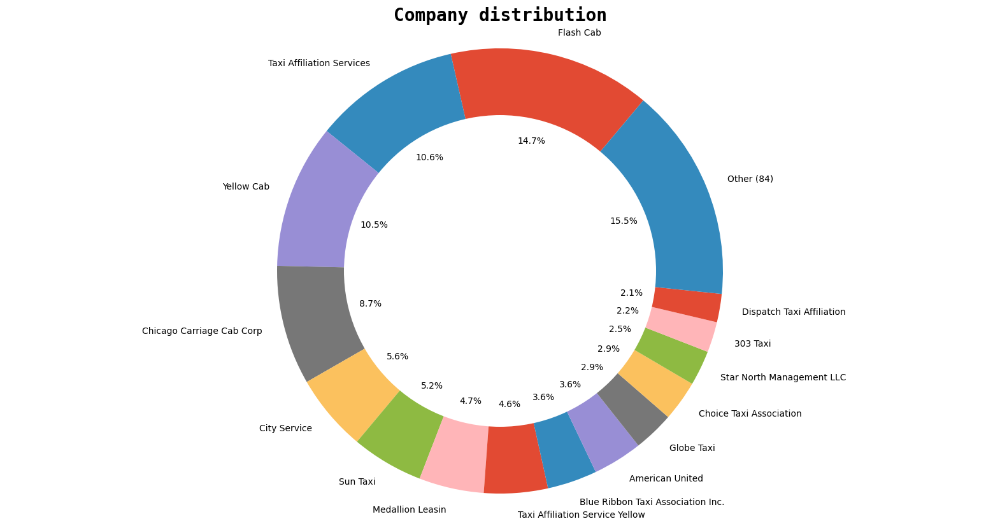

In [32]:
plt.style.use('ggplot')
plt.figure(figsize = (20, 10))
plt.pie(list(custom_company_data.values()), labels = list(custom_company_data.keys()), startangle = 50, autopct = '%1.1f%%')
centre_circle = plt.Circle((0, 0), 0.7, fc = 'white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.title('Company distribution', fontdict = {'fontname' : 'Monospace', 'fontsize' : 20, 'fontweight' : 'bold'})
plt.axis('equal')
# plt.legend(prop = {'size' : 20})
plt.show()

Let's see if there is a company which have higher fares in a scatterplot with hue.

In [33]:
# Filter trip seconds greater than 3000 seconds
trip_seconds_filter = df_sample["trip_seconds"] <= 3000

# First apply the trip seconds filter
df_sample = df_sample[trip_seconds_filter]

# Filter trip seconds greater than 60 seconds
trip_seconds_filter = df_sample["trip_seconds"] > 60

# Flter trip miles greater than 20 miles
trip_minutes_filter = df_sample["trip_miles"] <= 20

# Filter fare greater than 40 dollars
trip_fare_filter = df_sample["fare"] <= 40

# Filter tips greater than 8 dollars
tips_filter = df_sample["tips"] <= 8

# Filter extras greater than 10 dollars
extras_filter = df_sample["extras"] <= 10

# Filter tolls greater than 10 dollars
tolls_filter = df_sample["tolls"] <= 10

# Filter trip total greater than 50 dollars
trip_total_filter = df_sample["trip_total"] <= 50

# Build filter
filter = (trip_minutes_filter) & (trip_fare_filter) & (tips_filter) & (trip_total_filter) & (extras_filter) & (tolls_filter)

# Apply filter
df_sample = df_sample[filter]

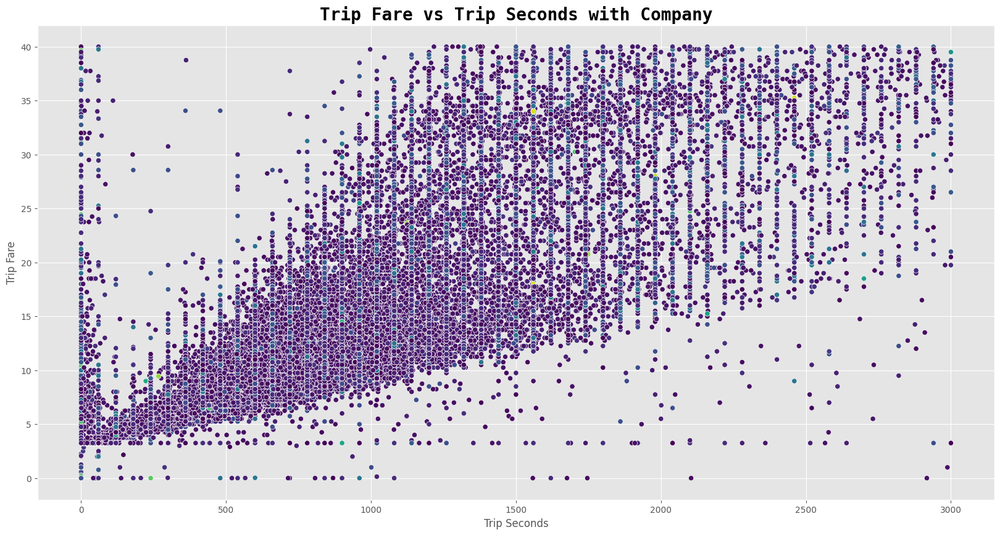

In [34]:
# plot fare vs trip_seconds with heu
plt.style.use('ggplot')
plt.figure(figsize=(20, 10))
sns.scatterplot(x='trip_seconds', y='fare', data=df_sample, hue='company', palette='viridis')
# plt.colorbar(label='Trip Fare vs Trip Seconds')
plt.title('Trip Fare vs Trip Seconds with Company', fontdict={'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.xlabel('Trip Seconds')

plt.ylabel('Trip Fare')
# remove labels
plt.legend().remove()
plt.show()

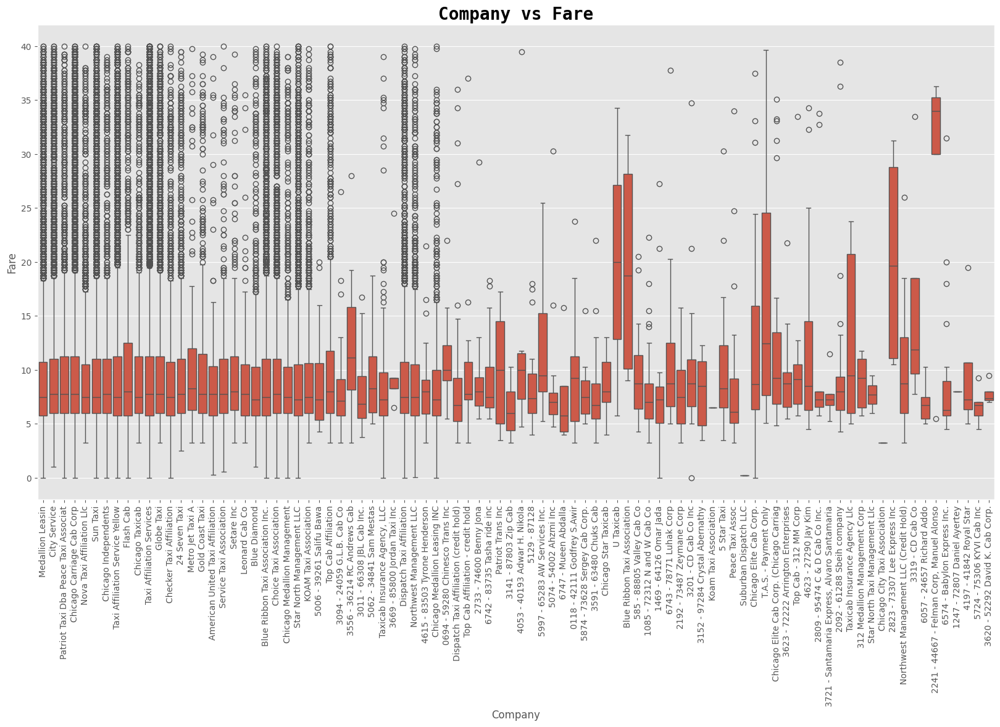

In [35]:
plt.style.use('ggplot')
plt.figure(figsize=(20, 10))
sns.boxplot(x='company', y='fare', data=df_sample)
plt.title('Company vs Fare', fontdict={'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.xlabel('Company')
# rotate x labels 90 degrees
plt.xticks(rotation=90)
plt.ylabel('Fare')
plt.show()

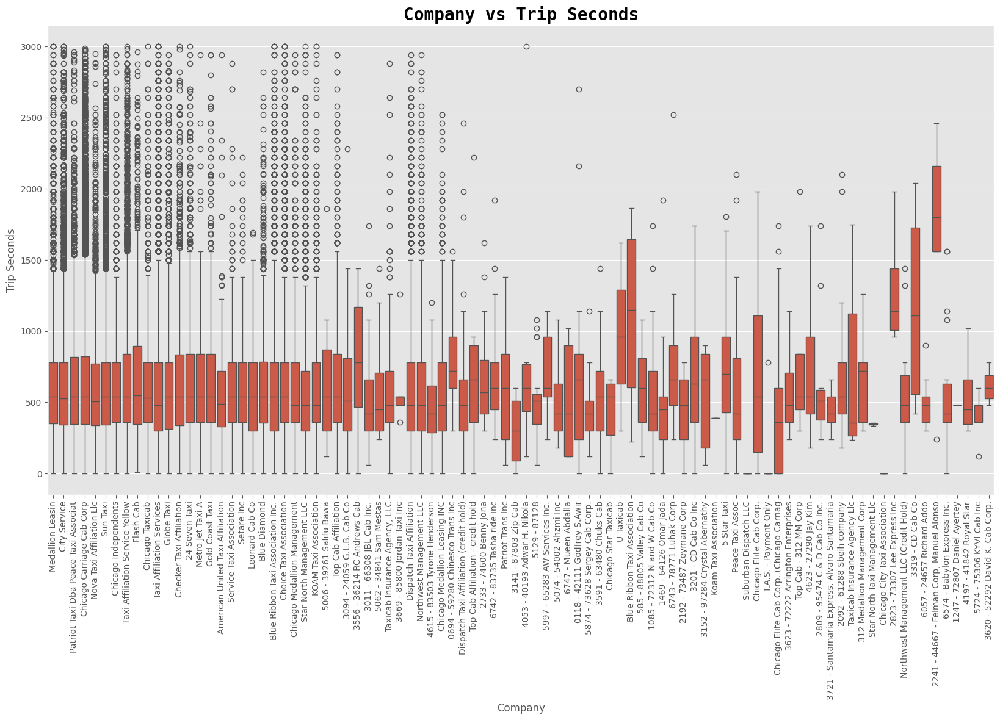

In [36]:
plt.style.use('ggplot')
plt.figure(figsize=(20, 10))
sns.boxplot(x='company', y='trip_seconds', data=df_sample)
plt.title('Company vs Trip Seconds', fontdict={'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.xlabel('Company')
# rotate x labels 90 degrees
plt.xticks(rotation=90)
plt.ylabel('Trip Seconds')
plt.show()

As can be seen in the two plots above, every company has the same fare rate, the ones that have higher average fares are the ones that made longer trips so it is expected to have higher fares.

Now let's see the payment type.

In [41]:
payment_type = df_categorical_sample["payment_type"].value_counts()
payment_type_percentage = payment_type / payment_type.sum() * 100

payment_type_data = {payment_type_percentage.index[i]: payment_type_percentage.values[i] for i in range(len(payment_type_percentage))}


other_payment_perc = 0
total_other_payment = 0
n = 2 # Minimum percentage threshold
for k, v in payment_type_data.items():
    if v < n:
        other_payment_perc += v
        total_other_payment += 1

custom_payment_type_data = {k: v for k, v in payment_type_data.items() if v >= n}
custom_payment_type_data[f"Other ({total_other_payment})"] = other_payment_perc



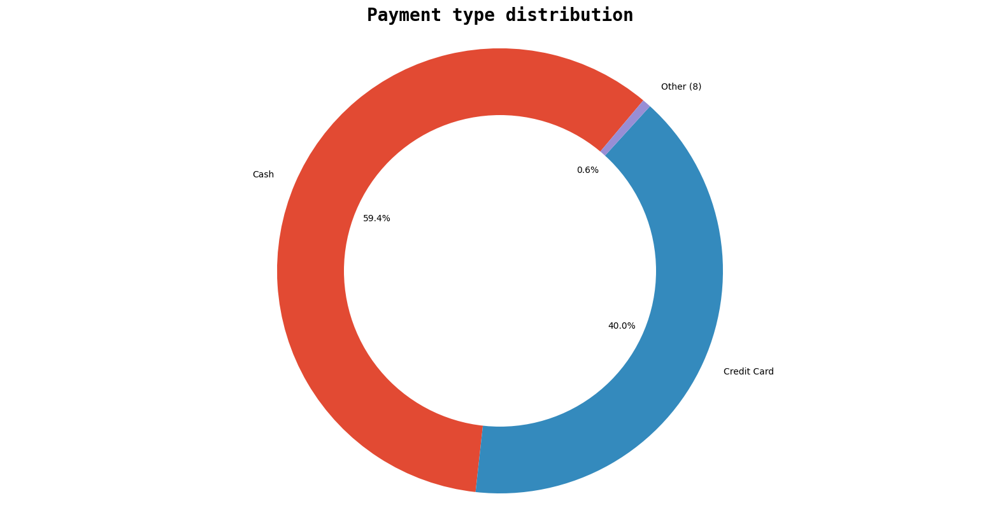

In [44]:
plt.style.use('ggplot')
plt.figure(figsize = (20, 10))
plt.pie(list(custom_payment_type_data.values()), labels = list(custom_payment_type_data.keys()), startangle = 50, autopct = '%1.1f%%')
centre_circle = plt.Circle((0, 0), 0.7, fc = 'white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.title('Payment type distribution', fontdict = {'fontname' : 'Monospace', 'fontsize' : 20, 'fontweight' : 'bold'})
plt.axis('equal')
# plt.legend(prop = {'size' : 20})
plt.show()

Now let's see the total fare distribution grouped by Cash and Credit Card payment types.

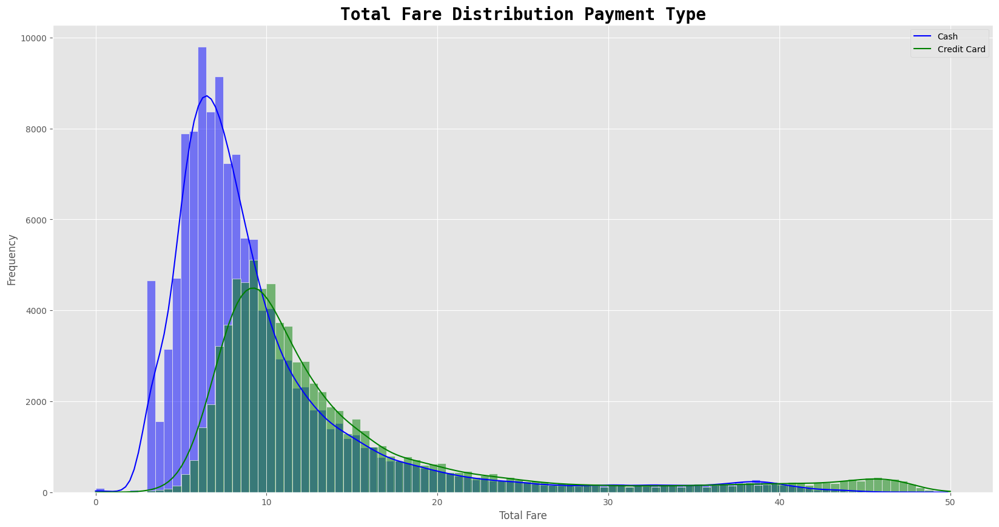

In [48]:
# Filter total fare by Cash payment type
cash_payment_filter = df_sample["payment_type"] == "Cash"

# Filter total fare by Credit Card payment type
credit_card_payment_filter = df_sample["payment_type"] == "Credit Card"

# Plot total fare distribution for Cash payment type
plt.style.use('ggplot')
plt.figure(figsize=(20, 10))
sns.histplot(df_sample[cash_payment_filter]["trip_total"], bins=100, kde=True, color='blue')
sns.histplot(df_sample[credit_card_payment_filter]["trip_total"], bins=100, kde=True, color='green')
plt.title('Total Fare Distribution Payment Type', fontdict={'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.xlabel('Total Fare')
plt.ylabel('Frequency')
plt.legend(['Cash', 'Credit Card'])
plt.show()

It is expected that the Credit Card payment type has greater mean total fare given that usually people uses cash for smaller expenses. Also, $99.4\%$ of payment types are Cash and Credit Card, so we can drop every other payment type and encode those types into binary integer 0 and 1.

## Step 5: Total fare for workdays, weekends, work and non-work hours

Extract weekday and hour from trip start timestamp

In [55]:
# Convert trip_start_timestamp to datetime
df_sample["trip_start_datetime"] = pd.to_datetime(df_sample["trip_start_timestamp"])

# Extract the day of the week from the trip start datetime
df_sample["day_of_week"] = df_sample["trip_start_datetime"].dt.weekday

# Extract hour of the day from the trip start datetime
df_sample["hour_of_day"] = df_sample["trip_start_datetime"].dt.hour

Encode workdays in a way that from Monday to Friday is 1 and Saturday/Sunday are 0. Also, assuming that work-hours are from 8am to 6pm, encode work-hours to 1 and non-work-hours to 0

In [57]:
# Encode work day to 1 and weekend to 0
df_sample["work_day"] = df_sample["day_of_week"].apply(lambda x: 1 if x < 5 else 0)

# Encode work hours to 1 and non-work hours to 0
df_sample["work_hour"] = df_sample["hour_of_day"].apply(lambda x: 1 if 8 <= x <= 18 else 0)

Now, plot the total fare for work and non-work days and hours

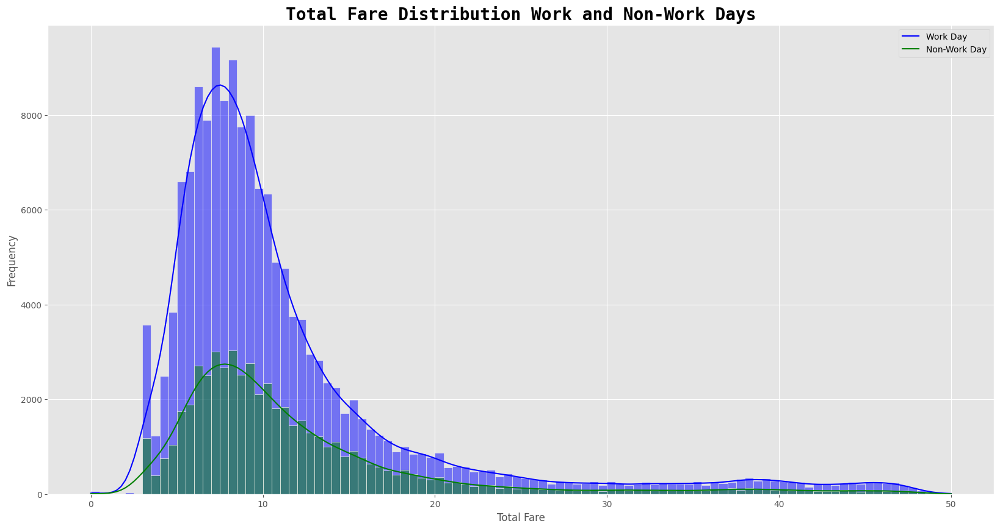

In [60]:
# Plot total fare distribution for work day
plt.style.use('ggplot')
plt.figure(figsize=(20, 10))
sns.histplot(df_sample[df_sample["work_day"] == 1]["trip_total"], bins=100, kde=True, color='blue')
sns.histplot(df_sample[df_sample["work_day"] == 0]["trip_total"], bins=100, kde=True, color='green')
plt.title('Total Fare Distribution Work and Non-Work Days', fontdict={'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.xlabel('Total Fare')
plt.ylabel('Frequency')
plt.legend(['Work Day', 'Non-Work Day'])
plt.show()

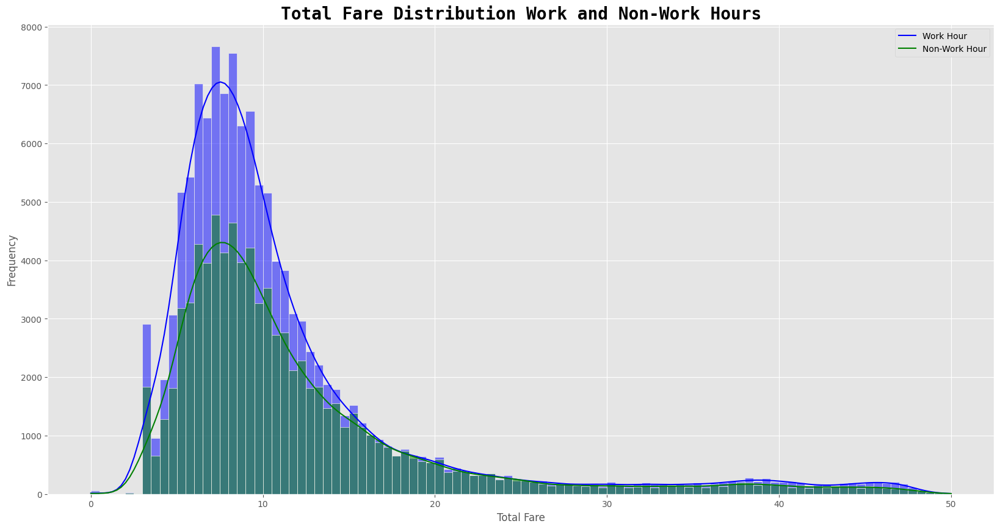

In [61]:
# Plot total fare distribution for work hours
plt.style.use('ggplot')
plt.figure(figsize=(20, 10))
sns.histplot(df_sample[df_sample["work_hour"] == 1]["trip_total"], bins=100, kde=True, color='blue')
sns.histplot(df_sample[df_sample["work_hour"] == 0]["trip_total"], bins=100, kde=True, color='green')
plt.title('Total Fare Distribution Work and Non-Work Hours', fontdict={'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.xlabel('Total Fare')
plt.ylabel('Frequency')
plt.legend(['Work Hour', 'Non-Work Hour'])
plt.show()

As expected, during non-work days and hours there are much less taxi cab trips.

## 6. Conclusions

#### 1. The most relevant numerical features are `trip_seconds`, `trip_miles`, `fare` and `trip_total`.
#### 2. Pickup and dropoff coordinates don't play a key role in the fare because they are captured in the trip time and miles. 
#### 3. Categorical variables, mainly company, do not add any extra information to the fare.
#### 4. Features which have the most missing values do not add extra info to the problem, which is a regression to predict the fare of a trip.
#### 5. Work days and hours have much more taxi cab trips than non-work days and hours
#### 6. There are two dominant payment methods, Cash and Credit Card.

Given that we want to predict the total fare of a trip, EDA gave us insights about features that we may work with:
1. `trip_seconds`
2. `trip_miles`
3. `fare`
4. `trip_total`
5. `payment_type` encoded
6. `weekday` encoded
7. `hours` encoded
8. `pickup_community_area`
9. `dropoff_community_area`